In [1]:
import wandb
import pandas as pd
import ydata_profiling
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
run = wandb.init(project='nyc_airbnb', group="eda", save_code=True, name='data-exploration-phase')
local_path = run.use_artifact("sample.csv:latest").file()

wandb: Currently logged in as: touyeachille (mlop_team). Use `wandb login --relogin` to force relogin


In [3]:
df = pd.read_csv(local_path)
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,9138664,Private Lg Room 15 min to Manhattan,47594947,Iris,Queens,Sunnyside,40.74271,-73.92493,Private room,74,2,6,2019-05-26,0.13,1,5
1,31444015,TIME SQUARE CHARMING ONE BED IN HELL'S KITCHEN...,8523790,Johlex,Manhattan,Hell's Kitchen,40.76682,-73.98878,Entire home/apt,170,3,0,NaN,NaN,1,188
2,8741020,Voted #1 Location Quintessential 1BR W Village...,45854238,John,Manhattan,West Village,40.73631,-74.00611,Entire home/apt,245,3,51,2018-09-19,1.12,1,0
3,34602077,Spacious 1 bedroom apartment 15min from Manhattan,261055465,Regan,Queens,Astoria,40.76424,-73.92351,Entire home/apt,125,3,1,2019-05-24,0.65,1,13
4,23203149,Big beautiful bedroom in huge Bushwick apartment,143460,Megan,Brooklyn,Bushwick,40.69839,-73.92044,Private room,65,2,8,2019-06-23,0.52,2,8


In [4]:
df.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
19995,7094539,Tranquil haven in bubbly Brooklyn,2052211,Adriana,Brooklyn,Windsor Terrace,40.65360,-73.97546,Entire home/apt,143,14,2,2016-08-27,0.04,1,10
19996,4424261,Large 1 BR with backyard on UWS,3447311,Sarah,Manhattan,Upper West Side,40.80188,-73.96808,Entire home/apt,200,2,22,2019-05-21,0.50,1,0
19997,4545882,Amazing studio/Loft with a backyard,23569951,Kaveh,Manhattan,Upper East Side,40.78110,-73.94567,Entire home/apt,220,3,28,2019-05-23,0.50,1,293
19998,26518547,U2 comfortable double bed sleeps 2 guests,295128,Carol Gloria,Bronx,Clason Point,40.81225,-73.85502,Private room,80,1,4,2019-07-01,1.48,7,365
19999,33631782,Private Bedroom in Williamsburg Apt!,8569221,Andi,Brooklyn,Williamsburg,40.71829,-73.95819,Private room,109,3,3,2019-04-28,1.07,2,97


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20000 non-null  int64  
 1   name                            19993 non-null  object 
 2   host_id                         20000 non-null  int64  
 3   host_name                       19992 non-null  object 
 4   neighbourhood_group             20000 non-null  object 
 5   neighbourhood                   20000 non-null  object 
 6   latitude                        20000 non-null  float64
 7   longitude                       20000 non-null  float64
 8   room_type                       20000 non-null  object 
 9   price                           20000 non-null  int64  
 10  minimum_nights                  20000 non-null  int64  
 11  number_of_reviews               20000 non-null  int64  
 12  last_review                     

In [6]:
profile = ydata_profiling.ProfileReport(df)

In [7]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df.isna().sum()

id                                   0
name                                 7
host_id                              0
host_name                            8
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       4123
reviews_per_month                 4123
calculated_host_listings_count       0
availability_365                     0
dtype: int64

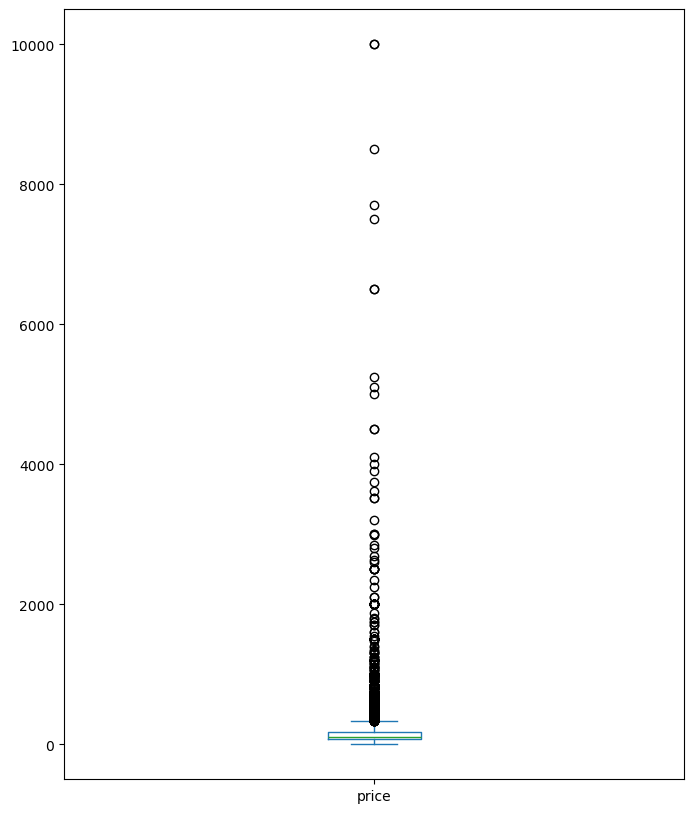

In [9]:
plt.figure(figsize=(8,10))
df["price"].plot(kind='box');

In [10]:
# Drop outliers
min_price = 10
max_price = 350
idx = df['price'].between(min_price, max_price)
df = df[idx].copy()
df=df.dropna()
# Convert last_review to datetime
df['last_review'] = pd.to_datetime(df['last_review'])

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15234 entries, 0 to 19999
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              15234 non-null  int64         
 1   name                            15234 non-null  object        
 2   host_id                         15234 non-null  int64         
 3   host_name                       15234 non-null  object        
 4   neighbourhood_group             15234 non-null  object        
 5   neighbourhood                   15234 non-null  object        
 6   latitude                        15234 non-null  float64       
 7   longitude                       15234 non-null  float64       
 8   room_type                       15234 non-null  object        
 9   price                           15234 non-null  int64         
 10  minimum_nights                  15234 non-null  int64         
 11  number_

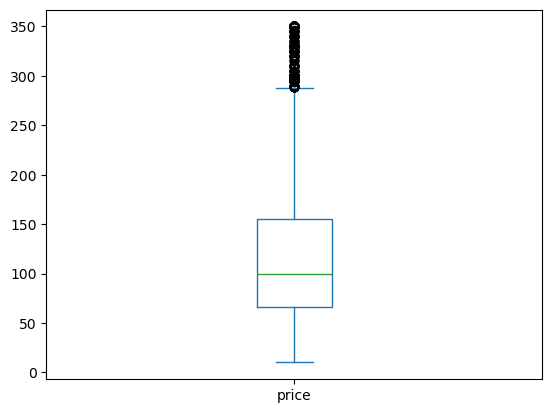

In [12]:
df["price"].plot(kind='box');

In [13]:
new_profile = ydata_profiling.ProfileReport(df)

In [14]:
new_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
run.finish()